In [1]:
import math
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from ipywidgets import IntProgress
import os
import cv2
import PIL
import PIL.Image
import json
import random
from random import randint as rand
from os import listdir
from os.path import isfile, join
gpus = tf.config.experimental.list_physical_devices('GPU')
print(gpus)
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)

[]


In [77]:
import random
import tensorflow as tf
import matplotlib.image as mpimg
import numpy as np


def generator():
    path = r'CPPE.v14i.yolokeras\update__annotations.txt'
    data = open(path, 'r').readlines()
    for el in data:
        path_image = el.replace('\n', '')
        path_label = (
            'PPE.v14i.yolokeras\\train\\labels\\'
            + path_image.split('\\')[-1].replace('\n', '') + '.txt'
        )

        bbox = []
        try:
            with open(path_label, 'r') as f:
                label = f.readlines()

            for e in label:
                if len(e) <= 1:
                    continue
                li = e.split()[1:]
                if len(li) < 4:
                    continue

                x1 = float(li[0]) 
                y1 = float(li[1])
                x2 = float(li[2]) 
                y2 = float(li[3]) 
             
                cx = (x1 + x2) / 2
                cy = (y1 + y2) / 2
                w = x2 - x1
                h = y2 - y1
                x1 = cx 
                y1 = cy
                x2 = w
                y2 = h

                bbox.append([x1, y1, x2, y2])
                if len(bbox) >= 50:
                    break
        except FileNotFoundError:
            continue

        try:
            image = tf.image.resize(
                tf.cast(mpimg.imread(path_image), tf.float32),
                (224, 224)
            ) / 255.0
        except Exception as e:
            continue

        if len(bbox) == 0:
            continue

        rotation = random.choice([0])
        rotated_image = tf.image.rot90(image, k=rotation)

        rotated_bbox = []
        for box in bbox:
            x1, y1, x2, y2 = box

            if rotation == 1:
     
                new_x1, new_y1, new_x2, new_y2 = x1, y1, x2, y2
            elif rotation == 2:
                new_x1, new_y1, new_x2, new_y2 = x1, y1, x2, y2
            elif rotation == 3:
                new_x1, new_y1, new_x2, new_y2 = x1, y1, x2, y2
            else:
                new_x1, new_y1, new_x2, new_y2 = x1, y1, x2, y2

            rotated_bbox.append([new_x1, new_y1, new_x2, new_y2, 0.0])

        

        all_boxes = rotated_bbox 

        yield (rotated_image, tf.constant(all_boxes, dtype=tf.float32))
def valid_generator():
    path = r'PPE.v14i.yolokeras\update_test_annotations.txt'
    data = open(path, 'r').readlines()
    for el in data:
        path_image = el.replace('\n', '')
        path_label = (
            'PPE.v14i.yolokeras\\test\\labels\\'
            + path_image.split('\\')[-1].replace('\n', '') + '.txt'
        )

        bbox = []
        try:
            with open(path_label, 'r') as f:
                label = f.readlines()

            for e in label:
                if len(e) <= 1:
                    continue
                li = e.split()[1:]
                if len(li) < 4:
                    continue

                x1 = float(li[0]) 
                y1 = float(li[1]) 
                x2 = float(li[2]) 
                y2 = float(li[3]) 

                cx = (x1 + x2) / 2
                cy = (y1 + y2) / 2
                w = x2 - x1
                h = y2 - y1
                x1 = cx 
                y1 = cy
                x2 = w
                y2 = h

                bbox.append([x1, y1, x2, y2])
                if len(bbox) >= 50:
                    break
        except FileNotFoundError:
            continue

        try:
            image = tf.image.resize(
                tf.cast(mpimg.imread(path_image), tf.float32),
                (224, 224)
            ) / 255.0
        except Exception as e:
            continue

        if len(bbox) == 0:
            continue

        bbox_with_flag = [[x1, y1, x2, y2, 0.0] for x1, y1, x2, y2 in bbox]

        yield (image, tf.constant(bbox_with_flag, dtype=tf.float32))
dataset = tf.data.Dataset.from_generator(
    generator,
    output_signature=(
        tf.TensorSpec(shape=(224, 224, 3), dtype=tf.float32),
        tf.TensorSpec(shape=(None, 5), dtype=tf.float32) 
    )
)

valid_dataset = tf.data.Dataset.from_generator(
    valid_generator,
    output_signature=(
        tf.TensorSpec(shape=(224, 224, 3), dtype=tf.float32),
        tf.TensorSpec(shape=(None, 5), dtype=tf.float32)  
    )
)

dataset = dataset.cache().prefetch(buffer_size=tf.data.AUTOTUNE).shuffle(100)
valid_dataset = valid_dataset.cache().prefetch(buffer_size=tf.data.AUTOTUNE)


In [236]:
backbone_encoder = tf.keras.models.load_model(
    r'models/base_classifier.h5', 
    compile=False,
)

In [273]:
output_tensor = backbone_encoder.output
output_tensor = tf.keras.layers.GlobalAveragePooling2D()(output_tensor)
clipped_model = tf.keras.Model(backbone_encoder.input, output_tensor)

In [274]:
clipped_model.summary()

Model: "functional_30"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)      │ (None, 224, 224, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ Conv1 (Conv2D)                │ (None, 112, 112, 32)      │             864 │ input_layer[0][0]          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ bn_Conv1 (BatchNormalization) │ (None, 112, 112, 32)      │             128 │ Conv1[0][0]                │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ Conv1_relu (ReLU)             │ (None, 112, 112, 32)      │               0 │ bn_Conv1[0][0]             │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_depthwise       │ (None, 112, 112, 32)      │             288 │ Conv1_relu[0][0]           │
│ (DepthwiseConv2D)             │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_depthwise_BN    │ (None, 112, 112, 32)      │             128 │ expanded_conv_depthwise[0… │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_depthwise_relu  │ (None, 112, 112, 32)      │               0 │ expanded_conv_depthwise_B… │
│ (ReLU)                        │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_project         │ (None, 112, 112, 16)      │             512 │ expanded_conv_depthwise_r… │
│ (Conv2D)                      │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_project_BN      │ (None, 112, 112, 16)      │              64 │ expanded_conv_project[0][… │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_expand (Conv2D)       │ (None, 112, 112, 96)      │           1,536 │ expanded_conv_project_BN[… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_expand_BN             │ (None, 112, 112, 96)      │             384 │ block_1_expand[0][0]       │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_expand_relu (ReLU)    │ (None, 112, 112, 96)      │               0 │ block_1_expand_BN[0][0]    │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_pad (ZeroPadding2D)   │ (None, 113, 113, 96)      │               0 │ block_1_expand_relu[0][0]  │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_depthwise             │ (None, 56, 56, 96)        │             864 │ block_1_pad[0][0]          │
│ (DepthwiseConv2D)             │                           │               

 Total params: 616,256 (2.35 MB)

 Trainable params: 334,272 (1.28 MB)

 Non-trainable params: 281,984 (1.08 MB)

In [275]:
X = []
y = []

for el in dataset:
    X.append(clipped_model.predict(tf.expand_dims(el[0], axis = 0), verbose = 0))
    y.append(el[1][:, :-1])

X = np.array(X)


In [276]:
y = np.array(y, dtype=object) 

In [277]:
X = X.reshape(X.shape[0], -1)

In [278]:
y = y.reshape(y.shape[0], -1)

In [279]:
y = [el[0].numpy().flatten() for el in y]

In [280]:
max_len = max(len(el) for el in y)

In [281]:
max_len

200

In [282]:
y_padded = []
for arr in y:
    pad_size = max_len - len(arr)
    padded = np.pad(arr, (0, pad_size), mode='constant', constant_values=0)
    y_padded.append(padded)

y = np.array(y_padded)


In [283]:
y.shape

(3725, 200)

In [284]:
X_val = []
y_val = []
for el in valid_dataset:
    X_val.append(clipped_model.predict(tf.expand_dims(el[0], axis = 0), verbose = 0))
    y_val.append(el[1][:, :-1])

X_val = np.array(X_val)


In [285]:
y_val = np.array(y_val, dtype = np.object_)

In [286]:
X_val = X_val.reshape(X_val.shape[0], -1)

In [287]:
y_val = y_val.reshape(y_val.shape[0], -1)

In [288]:
y_val = [el[0].numpy().flatten() for el in y_val]

In [289]:
y_val[0]

array([0.49140626, 0.16484375, 0.1171875 , 0.1046875 , 0.5023438 ,
       0.43828124, 0.1921875 , 0.2984375 , 0.49765626, 0.5359375 ,
       0.2765625 , 0.928125  ], dtype=float32)

In [290]:
y_padded = []
for arr in y_val:
    pad_size = max_len - len(arr)
    padded = np.pad(arr, (0, pad_size), mode='constant', constant_values=0)
    y_padded.append(padded)

y_val = np.array(y_padded)

In [291]:
X_val.shape

(92, 1152)

In [292]:
y_val.shape

(92, 200)

In [334]:
import tensorflow as tf
import numpy as np

import tensorflow as tf
import math

def masked_ciou_loss(y_true, y_pred):

    true_boxes = tf.reshape(y_true, (-1, 50, 4))
    pred_boxes = tf.reshape(y_pred, (-1, 50, 4))


    mask = tf.cast(tf.reduce_sum(tf.abs(true_boxes), axis=-1) > 0.0001, tf.float32)
    mask = tf.expand_dims(mask, axis=-1)

    gt_cx, gt_cy, gt_w, gt_h = tf.unstack(true_boxes, axis=-1)
    p_cx, p_cy, p_w, p_h = tf.unstack(pred_boxes, axis=-1)

    gt_x1 = gt_cx - gt_w / 2.0
    gt_y1 = gt_cy - gt_h / 2.0
    gt_x2 = gt_cx + gt_w / 2.0
    gt_y2 = gt_cy + gt_h / 2.0

    p_x1 = p_cx - p_w / 2.0
    p_y1 = p_cy - p_h / 2.0
    p_x2 = p_cx + p_w / 2.0
    p_y2 = p_cy + p_h / 2.0

    inter_x1 = tf.maximum(gt_x1, p_x1)
    inter_y1 = tf.maximum(gt_y1, p_y1)
    inter_x2 = tf.minimum(gt_x2, p_x2)
    inter_y2 = tf.minimum(gt_y2, p_y2)

    inter_w = tf.maximum(0.0, inter_x2 - inter_x1)
    inter_h = tf.maximum(0.0, inter_y2 - inter_y1)
    inter_area = inter_w * inter_h

    gt_area = gt_w * gt_h
    p_area = p_w * p_h
    union_area = gt_area + p_area - inter_area + 1e-7

    iou = inter_area / union_area

    c_x1 = tf.minimum(gt_x1, p_x1)
    c_y1 = tf.minimum(gt_y1, p_y1)
    c_x2 = tf.maximum(gt_x2, p_x2)
    c_y2 = tf.maximum(gt_y2, p_y2)
    
    c_diag = tf.square(c_x2 - c_x1) + tf.square(c_y2 - c_y1) + 1e-7
    rho2 = tf.square(gt_cx - p_cx) + tf.square(gt_cy - p_cy)
    diou = rho2 / c_diag


    w_h_ratio_gt = tf.atan(gt_w / (gt_h + 1e-7))
    w_h_ratio_pred = tf.atan(p_w / (p_h + 1e-7))
    
    v = (4.0 / (math.pi ** 2)) * tf.square(w_h_ratio_gt - w_h_ratio_pred)
    
    with tf.GradientTape() as tape:
        alpha = v / (1.0 - iou + v + 1e-7)
    
    ciou_val = iou - diou - (alpha * v)
    
    ciou_loss_val = 1.0 - ciou_val
    

    obj_loss = ciou_loss_val * tf.squeeze(mask, axis=-1)


    no_obj_mask = 1.0 - mask
    
    silence_loss = tf.reduce_sum(tf.square(pred_boxes), axis=-1) 
    silence_loss = silence_loss * tf.squeeze(no_obj_mask, axis=-1)

    silence_weight = 0.5 
    
    total_loss = tf.reduce_sum(obj_loss) + silence_weight * tf.reduce_sum(silence_loss)
    
    num_objects = tf.reduce_sum(mask) + 1.0
    
    return total_loss / num_objects


def create_ciou_mlp(input_dim=1152):
    model = tf.keras.Sequential([
        tf.keras.Input(shape=(input_dim,)),
        
        # Слой 1
        tf.keras.layers.Dense(1024), 
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Activation('relu'),
        
        # Слой 2
        tf.keras.layers.Dense(512), 
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Activation('relu'),

        tf.keras.layers.Dense(256),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Activation('relu'),
        

        tf.keras.layers.Dense(200, activation='sigmoid') 
    ])
    
    optimizer = tf.keras.optimizers.Adam(learning_rate=10e-4)
    model.compile(loss=masked_ciou_loss, optimizer=optimizer)
    
    return model




y_train_padded = y # (N, 200)
model = create_ciou_mlp()
history = model.fit(
    X, y,
    validation_data=(X_val, y_val),
    batch_size=32,
    epochs=1000,
    
)


Epoch 1/1000
117/117 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 1.5211 - val_loss: 1.1996
Epoch 2/1000
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.9363 - val_loss: 1.0827
Epoch 3/1000
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.8894 - val_loss: 1.0458
Epoch 4/1000
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.8651 - val_loss: 0.8850
Epoch 5/1000
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.8358 - val_loss: 1.4789
Epoch 6/1000
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.8142 - val_loss: 0.7990
Epoch 7/1000
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.8092 - val_loss: 0.7535
Epoch 8/1000
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.8007 - val_loss: 0.9393
Epoch 9/1000
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.7794 - val_loss: 0.7703
Epoch 10/1000
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.7713 - val_loss: 0.8501
Epoch 11/1000
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.7606 - val_loss: 0.8155
Epoch 12/1000
117/117 ━━━━━━━━

In [335]:
y_pred = model.predict(X_val)

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


In [336]:
from sklearn.metrics import mean_squared_error

In [337]:
mean_squared_error(y_val * 224, y_pred * 224)

np.float32(113.05203)

In [338]:
def restore_bboxes_auto(padded_array, threshold=0):
    
    non_zero_indices = np.where(np.abs(padded_array) > threshold)[0]
    
    if len(non_zero_indices) == 0:
        return np.array([]).reshape(0, 4)
    
    last_non_zero = non_zero_indices[-1]
    
    num_elements = last_non_zero + 1
    
    if num_elements % 4 != 0:
        num_elements = (num_elements // 4) * 4
        print(f"Внимание: количество элементов {last_non_zero+1} не кратно 4. Используем {num_elements}")
    
    real_data = padded_array[:num_elements]
    
    num_bboxes = num_elements // 4
    
    return real_data.reshape(num_bboxes, 4)

restored_auto = restore_bboxes_auto(y_pred[0])
print(f"Автоматически восстановлено bbox: {restored_auto.shape}")

Автоматически восстановлено bbox: (50, 4)


In [339]:
y_pred = [restore_bboxes_auto(el) for el in y_pred]

In [340]:
images = [el[0] for el in valid_dataset]

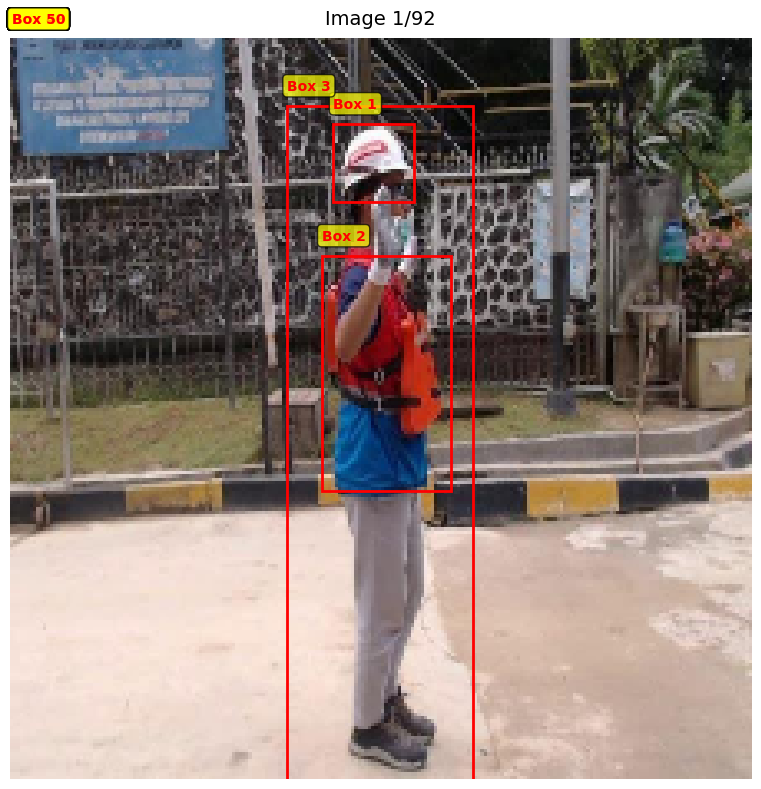

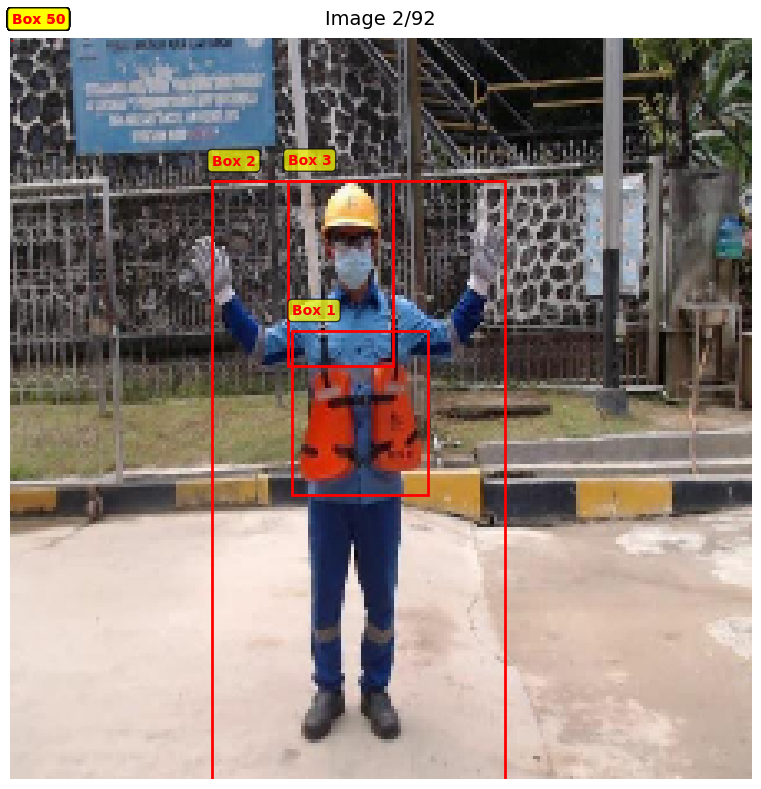

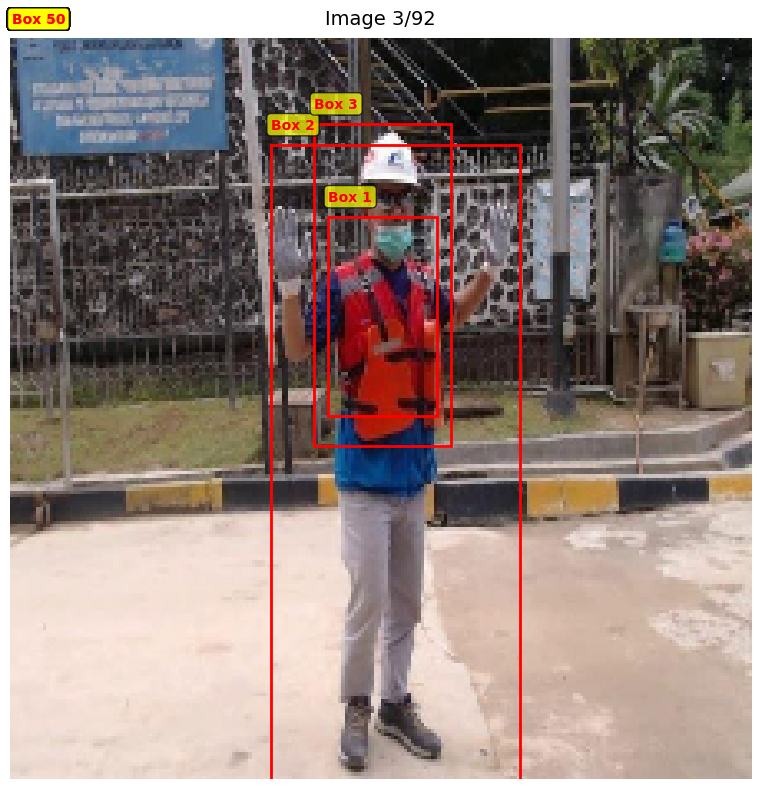

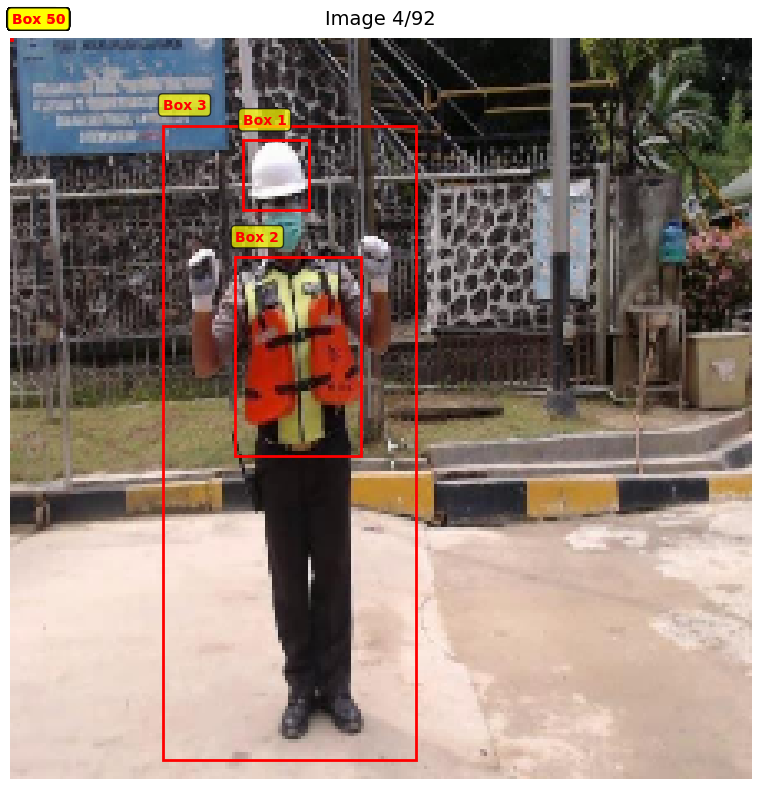

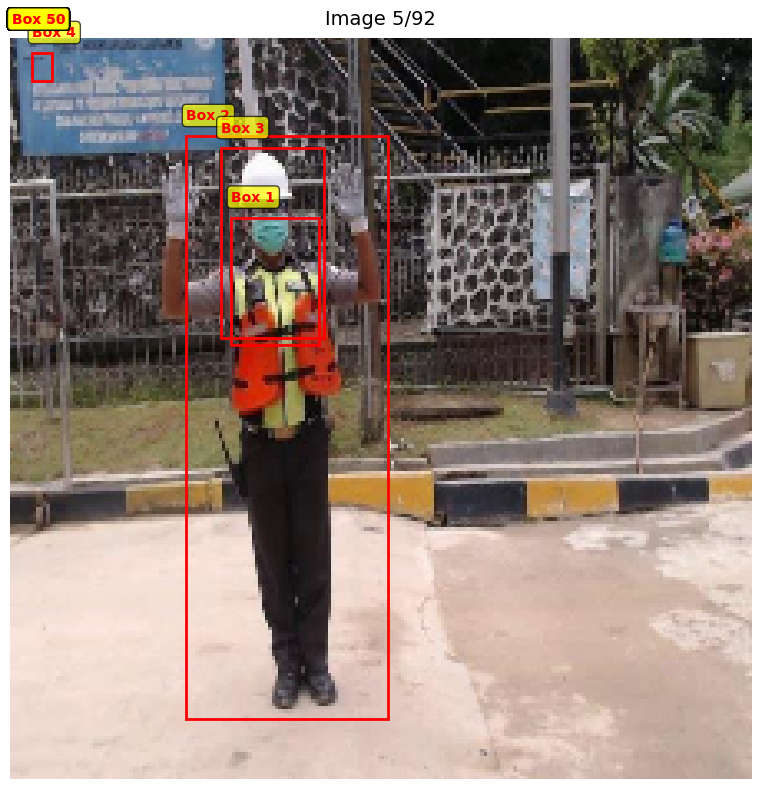

...

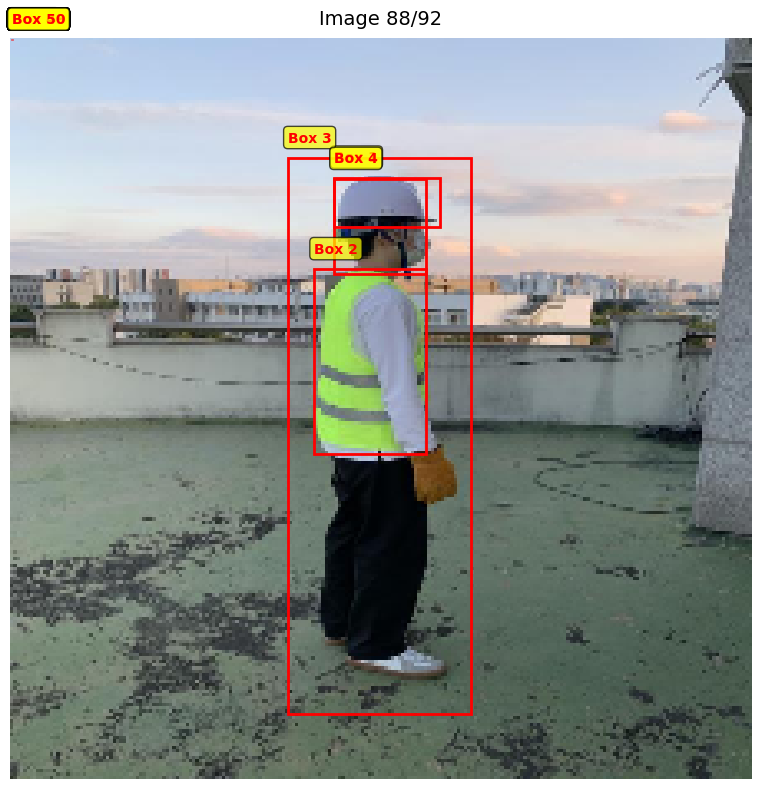

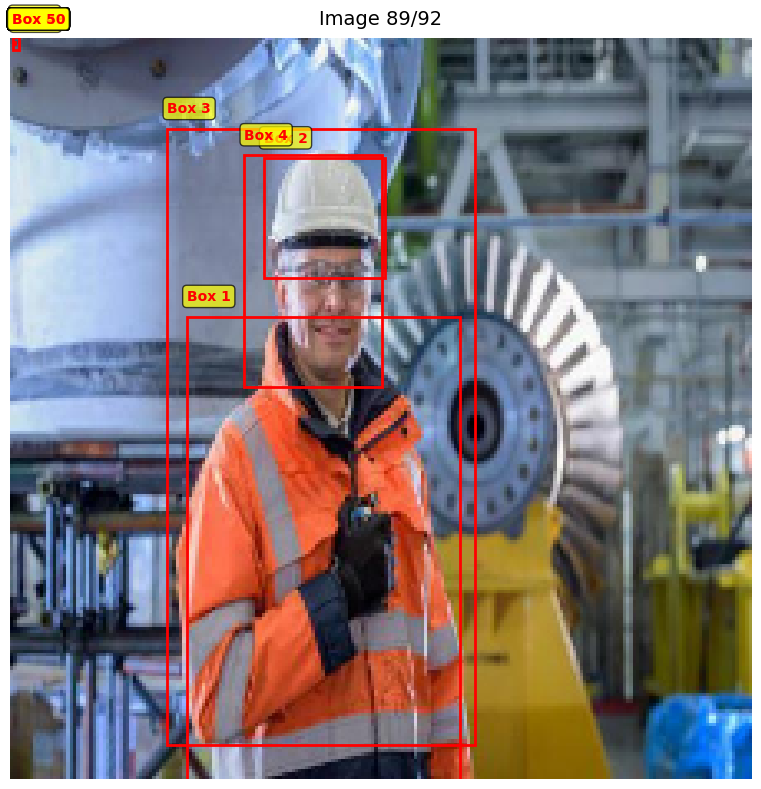

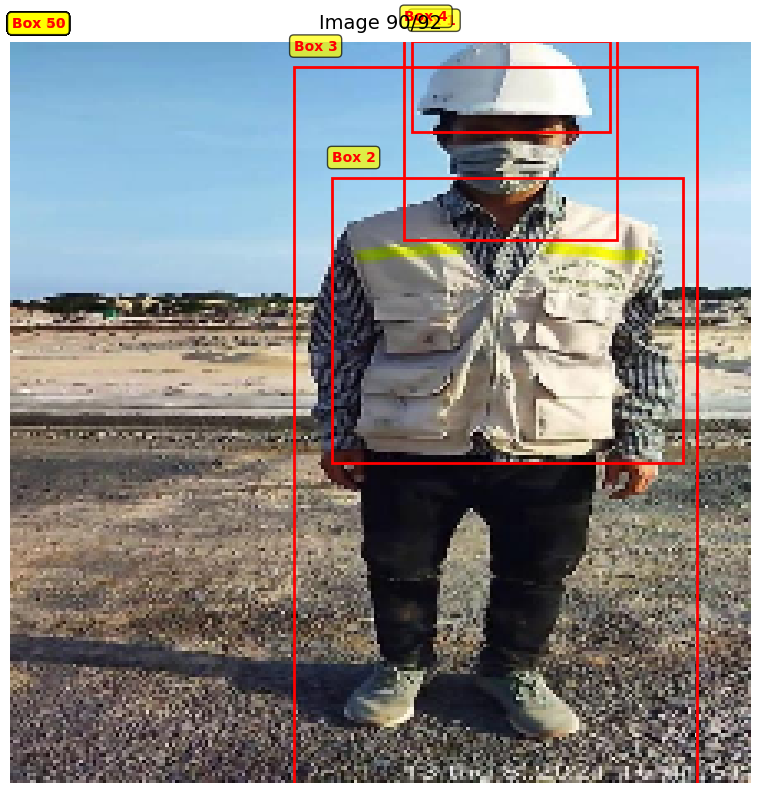

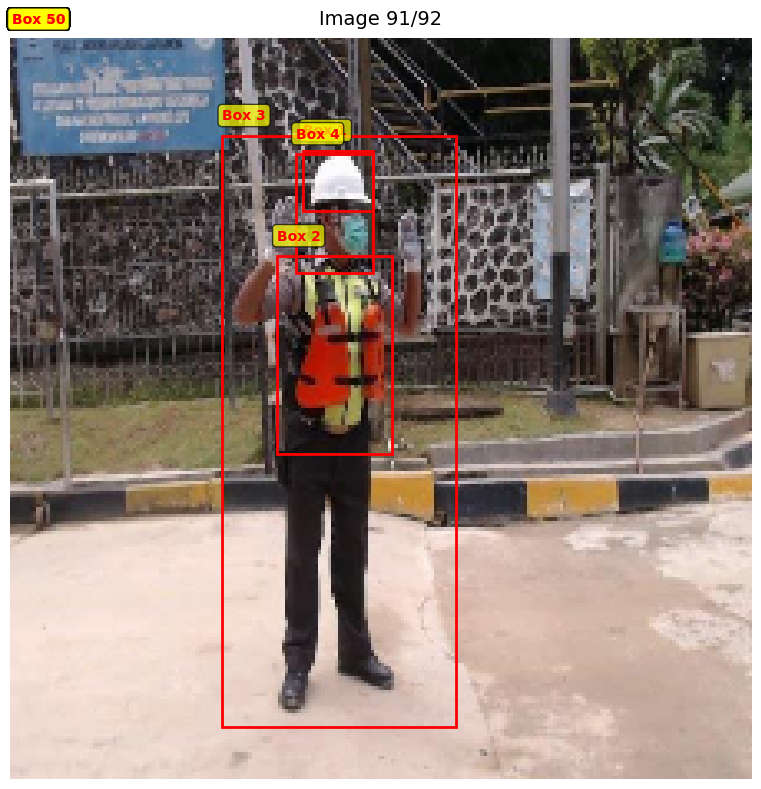

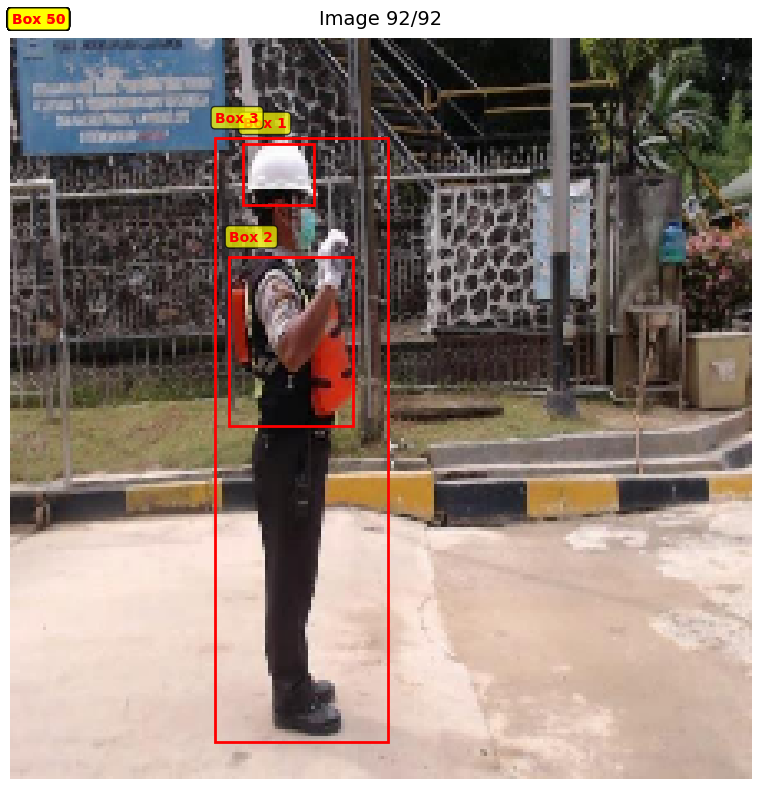


Отображено 92 изображений


In [341]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np

def visualize_predictions(images, bboxes, num_samples=5, figsize=(12, 8), conf_threshold=0.5):
    
    
    num_to_show = min(num_samples, len(images), len(bboxes))
    
    for i in range(num_to_show):
        fig, ax = plt.subplots(1, figsize=figsize)
        
        ax.imshow(images[i])
        ax.axis('off')
        ax.set_title(f'Image {i+1}/{num_to_show}', fontsize=14, pad=10)
        
        img_bboxes = bboxes[i]
        
        if not isinstance(img_bboxes, (list, np.ndarray)):
            img_bboxes = [img_bboxes]
        
        if len(img_bboxes) == 0:
            ax.text(112, 112, 'No objects detected', 
                   ha='center', va='center', 
                   fontsize=12, color='red',
                   bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
        else:
            for idx, bbox in enumerate(img_bboxes):
                if len(bbox) >= 4:
                    x, y, w, h = bbox[0] * 224, bbox[1] * 224, bbox[2] * 224, bbox[3] * 224
                    x-=w/2
                    y-=h/2
                    
                 
                    rect = patches.Rectangle(
                        (x, y), w, h,
                        linewidth=2,
                        edgecolor='red',
                        facecolor='none',
                        linestyle='-'
                    )
                    ax.add_patch(rect)
                    
                    ax.text(
                        x, y - 5,
                        f'Box {idx+1}',
                        color='red',
                        fontsize=10,
                        weight='bold',
                        bbox=dict(boxstyle='round,pad=0.3', facecolor='yellow', alpha=0.7)
                    )
                    
                    if len(bbox) >= 5:
                        conf = float(bbox[4])
                        if conf >= conf_threshold:
                            ax.text(
                                x, y + h + 15,
                                f'Conf: {conf:.2f}',
                                color='green',
                                fontsize=9,
                                bbox=dict(boxstyle='round,pad=0.2', facecolor='white', alpha=0.7)
                            )
        
        plt.tight_layout()
        plt.show()
    
    print(f'\nОтображено {num_to_show} изображений')



visualize_predictions(images, y_pred, num_samples=100)


In [351]:
model.save('models/RPN_MODEL.h5')

In [352]:
converter = tf.lite.TFLiteConverter.from_keras_model(model)


In [353]:
converter.optimizations = [tf.lite.Optimize.DEFAULT]

In [354]:
tflite_model = converter.convert()


INFO:tensorflow:Assets written to: C:\Users\47A8~1\AppData\Local\Temp\tmphfumk2kr\assets


INFO:tensorflow:Assets written to: C:\Users\47A8~1\AppData\Local\Temp\tmphfumk2kr\assets


Saved artifact at 'C:\Users\47A8~1\AppData\Local\Temp\tmphfumk2kr'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 1152), dtype=tf.float32, name='keras_tensor_1363')
Output Type:
  TensorSpec(shape=(None, 200), dtype=tf.float32, name=None)
Captures:
  2894484467216: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2894484471248: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2894473367952: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2894473366224: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2894484468176: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2894473368912: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2894473371600: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2894473367760: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2894473369104: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2894473369680: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2894

In [355]:
with open("models/model.tflite", "wb") as f:
    f.write(tflite_model)